In [ ]:
# --- Setup: make the `ecp` support package available -----------------
# Colab opens a single notebook and installs nothing, so fetch `ecp` from
# the public repo if it isn't importable yet. On Binder/local it is already
# installed, so this cell is a fast no-op there.
try:
    import ecp  # noqa: F401
except ModuleNotFoundError:
    import subprocess, sys
    subprocess.run(
        [sys.executable, "-m", "pip", "install", "-q",
         "git+https://github.com/ramador09/elementary-computational-physics-public@main"],
        check=True,
    )


# 3.10 Radiation

<!-- This single H1 (one per notebook, "# <number> <Title>") is the page's
     title: it sets the sidebar entry, breadcrumb, browser tab, and search
     result. The branded banner below is generated by the shared `ecp`
     package, so the look of every notebook in the series lives in one place. -->

In [1]:
from ecp.style import header, use_style

use_style()  # apply the series Matplotlib style
header(
    volume="Volume III — Classical Electrodynamics",
    number="3.10",
    title="Radiation",
    blurb="What makes the waves: accelerating charges. Retarded potentials and "
    "causality, the oscillating dipole and its sin²θ pattern, the Larmor formula, and "
    "the ω⁴ law that explains why the sky is blue.",
    difficulty="advanced",
    estimate="120–150 min",
)

<ECP header: 2543 chars of HTML>

## Notebook overview

[§3.8](maxwell-waves.ipynb) proved that electromagnetic waves *can* exist; this one shows what
*makes* them. The answer is sharp: **accelerating charges radiate**. A charge sitting
still carries a static field, and a charge gliding at constant velocity carries its
field along with it, but a charge that *accelerates* sheds a disturbance that detaches
and travels to infinity. That shed disturbance is light, radio, and X-rays alike.

Two ideas organize the story. The first is **causality through the retarded
potentials**: the field here and now depends on what the source was doing at the
earlier time $t_r=t-r/c$, because influence travels at $c$. These retarded potentials
are exactly the solutions of the Lorenz-gauge wave equations of
[§3.8](maxwell-waves.ipynb), so they quietly close the gauge arc that began in
[§3.6](magnetostatics.ipynb): the gauge choice made there returns here as the
causal, propagating field. The second idea is the **$1/r$ radiation field**. Expanding
the retarded field in powers of $1/r$ gives near-field terms ($1/r^2$, $1/r^3$, the
quasi-static fields of [§3.1](coulomb-field.ipynb) and
[§3.5](multipole-expansion.ipynb)) and a single slowly-falling $1/r$ term. Only that
term carries energy to infinity, because its Poynting flux ($\propto 1/r^2$) times the
sphere area ($4\pi r^2$) stays finite as $r\to\infty$. Radiation *is* the $1/r$ part.

From there everything follows: the oscillating dipole with its $\sin^2\theta$
doughnut pattern, the total power $P=\mu_0 p_0^2\omega^4/12\pi c$, the **$\omega^4$
law** that makes blue light scatter twelve times more strongly than red (why the sky is
blue), and the **Larmor formula** $P=\mu_0 q^2 a^2/6\pi c$ for a single accelerating
charge, whose corollary, that a classical orbiting electron must spiral into the
nucleus, is one of the cracks that forced quantum mechanics.

Everything is in **SI units**, with $c=1/\sqrt{\mu_0\varepsilon_0}$. A radiating field
genuinely propagates, so exactly one figure here is animated, the dipole's wavefronts
detaching and travelling outward; everything else is a still.

> **How to read the checks.** Each exercise ends with a `validate` call against an
> independent fact: an observed phase lag equal to $\omega r/c$, a power through a
> sphere independent of its radius, the $\sin^2\theta$ pattern integrating to $8\pi/3$,
> the $\omega^4$ ratio, the Larmor power. A ✓ is strong evidence; a ✗ is a prompt to
> *locate the discrepancy*, not a verdict.
>
> **Scope.** A working review, not a full course. See Nolting, *Theoretical Physics 3*
> {cite}`nolting3`; Griffiths, *Introduction to Electrodynamics* {cite}`griffiths_em`
> (ch. 11); Jackson {cite}`jackson` (ch. 9, 14).

## Theory in brief

### Retarded potentials and causality

A change in the source cannot be felt instantly; it propagates at $c$. The potentials
at a field point therefore depend on the source at the **retarded time** $t_r=t-r/c$,

```{math}
:label: eq-retarded
V(\mathbf r,t)=\frac{1}{4\pi\varepsilon_0}\int\frac{\rho(\mathbf r',t_r)}{|\mathbf r-\mathbf r'|}\,d^3r',
\qquad t_r = t-\frac{|\mathbf r-\mathbf r'|}{c}.
```

These are precisely the solutions of the Lorenz-gauge wave equations $\Box V=-\rho/
\varepsilon_0$, $\Box\mathbf A=-\mu_0\mathbf J$ of [§3.8](maxwell-waves.ipynb), so the
gauge choice made there yields the causal field here, closing the gauge arc; Griffiths,
*Introduction to Electrodynamics*, ch. 10, verifies by direct differentiation that the
retarded potentials do solve them. Causality is the new structural
idea: **the field knows only the source's past**.

### Why acceleration radiates

A static charge has a static field; a uniformly moving charge carries its field rigidly
along. Only an **accelerating** charge produces a field that detaches and propagates,

```{math}
:label: eq-why-radiate
\text{radiation} \iff \text{acceleration} \neq 0 .
```

A brief acceleration puts a transverse **kink** in the field lines that travels outward
at $c$, the radiation pulse.

### The radiation field versus the near field

Expanding the retarded field in $1/r$ gives near-field terms and one radiation term,

```{math}
:label: eq-far-field
\mathbf E = \underbrace{\mathcal{O}(1/r^2)+\mathcal{O}(1/r^3)}_{\text{near field}} + \underbrace{\mathcal{O}(1/r)}_{\text{radiation}} .
```

Only the $1/r$ term carries net energy to infinity: its Poynting flux $\propto 1/r^2$
times the sphere area $4\pi r^2$ stays finite as $r\to\infty$, while the near-field flux
vanishes. **Radiation is exactly the slowly-falling $1/r$ part.**

### The oscillating dipole

For a dipole $p(t)=p_0\cos\omega t$ the radiation field falls as $1/r$ and has the
angular power pattern

```{math}
:label: eq-dipole-radiation
\frac{dP}{d\Omega}\propto\sin^2\theta, \qquad
P = \frac{\mu_0 p_0^2\omega^4}{12\pi c},
```

zero along the dipole axis and maximum broadside, the toroidal "doughnut". Griffiths,
*Introduction to Electrodynamics*, ch. 11, carries the retarded-potential computation
behind both results out in full.

### The $\omega^4$ law

Radiated power scales as the fourth power of frequency,

```{math}
:label: eq-omega4
P \propto \omega^4 .
```

Air molecules driven by sunlight are little dipoles, so blue light (higher $\omega$)
scatters about $(\nu_{\text{blue}}/\nu_{\text{red}})^4\approx12$ times more than red:
**why the sky is blue** and sunsets red (Rayleigh scattering).

### The Larmor formula

For a single point charge of acceleration $a$,

```{math}
:label: eq-larmor
P = \frac{\mu_0 q^2 a^2}{6\pi c},
```

radiated power $\propto a^2$. The dipole result is its oscillating-source special case;
Jackson, *Classical Electrodynamics*, ch. 14, derives the general formula from the
fields of an arbitrarily moving point charge.

## Setup

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

from ecp import draw, validate
from ecp.animate import show

MU0 = 4.0e-7 * np.pi  # vacuum permeability, T·m/A
EPS0 = 8.8541878128e-12  # vacuum permittivity, F/m
C_LIGHT = 1.0 / np.sqrt(MU0 * EPS0)  # speed of light, m/s
ACCENT, INK, SOFT = draw.ACCENT, draw.INK, draw.SOFT


def dipole_power_pattern(theta):
    """Angular radiation pattern dP/dΩ ∝ sin^2 θ of a dipole (eq-dipole-radiation).

    The normalised pattern of an oscillating electric dipole: it vanishes along
    the axis (θ = 0, π) and peaks broadside (θ = π/2), the cross-section of the
    toroidal "doughnut".

    Parameters
    ----------
    theta : float or numpy.ndarray
        Polar angle from the dipole axis, in radians.

    Returns
    -------
    float or numpy.ndarray
        The relative power per solid angle, sin^2 θ.
    """
    return np.sin(theta) ** 2


def dipole_total_power(p0, omega):
    """Total time-averaged power radiated by an oscillating dipole (eq-dipole-radiation).

    P = μ0·p0^2·ω^4/(12π c): the ω^4 dependence is what makes high-frequency
    sources radiate so much more strongly.

    Parameters
    ----------
    p0 : float
        Dipole-moment amplitude, in C·m.
    omega : float
        Angular frequency, in rad/s.

    Returns
    -------
    float
        The total radiated power, in watts.
    """
    return MU0 * p0**2 * omega**4 / (12.0 * np.pi * C_LIGHT)


def larmor_power(q, a):
    """Larmor power radiated by a single accelerating point charge (eq-larmor).

    P = μ0·q^2·a^2/(6π c), proportional to the square of the acceleration: the
    general statement of which the dipole formula is the oscillating-source
    case.

    Parameters
    ----------
    q : float
        Charge, in coulombs.
    a : float
        Acceleration magnitude, in m/s².

    Returns
    -------
    float
        The instantaneous radiated power, in watts.
    """
    return MU0 * q**2 * a**2 / (6.0 * np.pi * C_LIGHT)


def radiation_field_plane(X, Z, t, omega, eps=0.04):
    """Dipole radiation field in the x–z plane, for the propagation animation.

    The far-field form E ∝ sin θ · cos(ω(t − r/c))/r on a slice containing the
    dipole axis ẑ: outgoing wavefronts modulated by the sin θ pattern,
    brightest broadside and null along the axis. A small core radius ``eps``
    is masked to avoid the 1/r singularity at the source.

    Parameters
    ----------
    X, Z : numpy.ndarray
        Coordinate grids in the plane (z is the dipole axis).
    t : float
        Time at which to evaluate.
    omega : float
        Angular frequency, in rad/s.
    eps : float, optional
        Core radius masked near the origin (default 0.04).

    Returns
    -------
    numpy.ndarray
        The (arbitrary-amplitude) radiation field on the grid, with the core set to zero.
    """
    r = np.hypot(X, Z)
    sin_theta = np.abs(X) / np.where(r > 0, r, 1.0)
    k = omega / C_LIGHT
    field = np.where(
        r > eps, sin_theta * np.cos(omega * t - k * r) / np.maximum(r, eps), 0.0
    )
    return field

## Exercise 1 — Retarded time and causality

Nothing the source does is felt instantly; its influence spreads at $c$. The field at
distance $r$ at time $t$ reflects the source at the **retarded time** $t_r=t-r/c$
{eq}`eq-retarded`, so a harmonic source $\cos(\omega t)$ is observed delayed, with a
phase lag $\omega r/c$ ({numref}`fig-rad-retard`). For a $1\,$GHz source at $r=0.5\,$m
the delay is about $1.7\,$ns.

**This exercise (worked).** Construct the observed signal as the source evaluated at
$t_r$, measure its phase by projecting onto $\cos\omega t$ and $\sin\omega t$ (a
least-squares phase fit over whole periods), and confirm the lag equals $\omega r/c$.
These retarded potentials are exactly the Lorenz-gauge solutions of the
[§3.8](maxwell-waves.ipynb) wave equations, so the gauge arc of
[§3.6](magnetostatics.ipynb)–[§3.8](maxwell-waves.ipynb) closes here: the field carries
only the source's **past**.

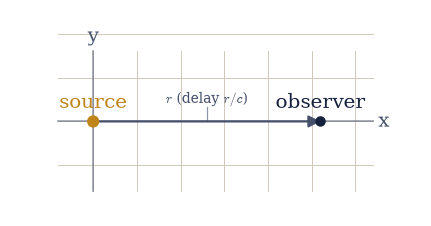

In [3]:
# (solution hidden on the public site)


In [4]:
# (solution hidden on the public site)


light-travel delay r/c = 1.668 ns
measured phase lag = 4.196040 rad,  ωr/c (mod 2π) = 4.196040 rad


### Validation 1

In [5]:
validate.close(
    phase_meas,
    phase_expected,
    "the observed field lags by ωr/c — the retarded-time delay (Lorenz-gauge solution)",
    rtol=1e-6,
)

✓  the observed field lags by ωr/c — the retarded-time delay (Lorenz-gauge solution)   [got 4.19604 vs expected 4.19604 (rtol=1e-06)]


True

## Exercise 2 — Why acceleration radiates

Three charges, three different fates for their fields {eq}`eq-why-radiate`. A **static**
charge has the radial $1/r^2$ Coulomb field of [§3.1](coulomb-field.ipynb), frozen in
place. A charge in
**uniform motion** carries that field rigidly along, with no piece left behind. Only an
**accelerating** charge launches a disturbance that separates from it: a brief
acceleration kinks the field lines, and the kink, the transverse $1/r$ radiation field,
races outward at $c$ ({numref}`fig-rad-kink`).

**This exercise (worked).** Make the criterion quantitative. The radiation
field amplitude is
$E_{\mathrm{rad}}\propto q\,a\,\sin\theta/(4\pi\varepsilon_0 c^2 r)$,
linear in the acceleration $a$.

1. Evaluate that closed-form amplitude at $a=0$ (static or uniform motion)
   and at $a\neq0$, and confirm the $1/r$ term exists only when the charge
   accelerates.
2. Confirm the linearity property $E_{\mathrm{rad}}(2a)=2\,E_{\mathrm{rad}}(a)$
   — doubling the acceleration doubles the radiated field.

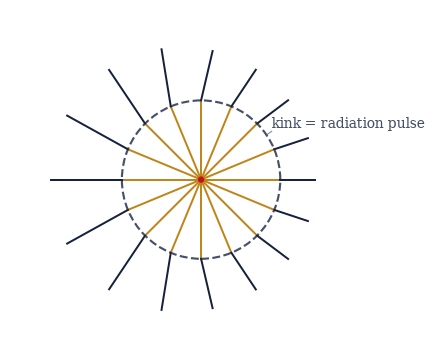

In [6]:
# (solution hidden on the public site)


In [7]:
# (solution hidden on the public site)


radiation field, a = 0     : 0.000e+00 V/m  (no 1/r term)
radiation field, a = 1e22  : 1.602e-04 V/m  (1/r term present)
E_rad(2a) = 2 E_rad(a): True  (linear in the acceleration)


### Validation 2

In [8]:
validate.check(
    E_static == 0.0 and E_accel > 0.0 and linear_in_a,
    "radiation requires acceleration: the 1/r far field appears only when a ≠ 0, "
    "and doubles when a doubles",
)

✓  radiation requires acceleration: the 1/r far field appears only when a ≠ 0, and doubles when a doubles


True

## Exercise 3 — Near field versus radiation field: the $1/r$ point

This is the heart of radiation. The retarded field of an oscillating dipole splits into
**near-field** pieces ($\propto 1/r^2$ and $1/r^3$, the quasi-static dipole field of
[§3.5](multipole-expansion.ipynb)) and a **radiation** piece ($\propto 1/r$)
{eq}`eq-far-field`. The distinction is
not cosmetic: the time-averaged Poynting flux of the radiation field falls as $1/r^2$,
so the power crossing a sphere, flux times $4\pi r^2$, is **independent of $r$**, while
the near-field flux falls faster and carries nothing to infinity.

**This exercise (worked).** For the radiation field $\langle S\rangle=\mu_0 p_0^2
\omega^4\sin^2\theta/(32\pi^2 c\,r^2)$:

1. Integrate the power through spheres of radius $r=1$, $10$, and $100\,$m
   (`numpy.trapezoid` over $\theta,\varphi$ with the $\sin\theta$ measure)
   and confirm it is the same number at every radius.
2. Contrast the near field, whose flux falls as $1/r^4$ so its power
   through the sphere collapses as $1/r^2$ ({numref}`fig-rad-power-r`).

Radiation is the slowly-falling $1/r$ part: that is what lets energy escape
to infinity.

In [9]:
# (solution hidden on the public site)


  r =      1 m:  radiation power = 1.732916e+05 W   near-field power ∝ 1e+00
  r =     10 m:  radiation power = 1.732916e+05 W   near-field power ∝ 1e-02
  r =    100 m:  radiation power = 1.732916e+05 W   near-field power ∝ 1e-04
analytic P = μ₀p₀²ω⁴/12πc = 1.732916e+05 W


### Validation 3

In [10]:
validate.close(
    np.array([powers[1.0], powers[10.0], powers[100.0]]),
    np.full(3, powers[1.0]),
    "only the 1/r radiation field carries constant power to infinity (r-independent)",
    rtol=1e-3,
)

✓  only the 1/r radiation field carries constant power to infinity (r-independent)   [max|Δ| = 0 (rtol=0.001, atol=1e-09)]


True

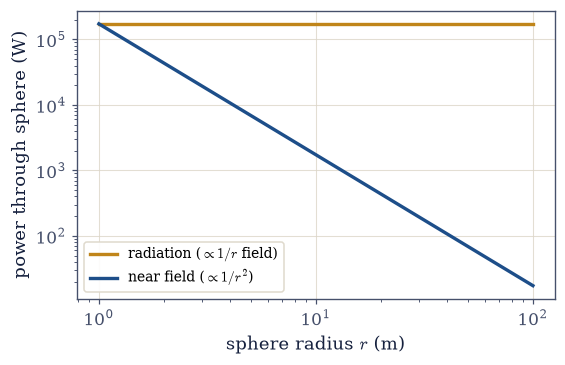

In [11]:
# (solution hidden on the public site)


## Exercise 4 — The oscillating dipole and its $\sin^2\theta$ pattern

The prototypical radiator is an oscillating electric dipole $p(t)=p_0\cos\omega t$, an
antenna in miniature. Its far field falls as $1/r$ and carries the angular power
pattern $dP/d\Omega\propto\sin^2\theta$ {eq}`eq-dipole-radiation`: nothing radiates
along the dipole axis, everything broadside, giving the toroidal **doughnut**
({numref}`fig-rad-dipole-setup`, {numref}`fig-rad-pattern`).

**This exercise (worked).** Evaluate the pattern, confirm it vanishes on the axis and
peaks broadside, and watch the field radiate: the animation
({numref}`fig-rad-animation`) shows the dipole's wavefronts detaching and travelling
outward at $c$, brightest at the equator and dark along the poles, the iconic image of
radiation.

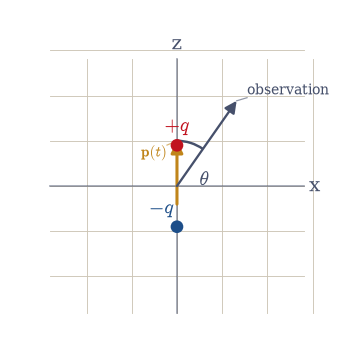

In [12]:
# (solution hidden on the public site)


In [13]:
# (solution hidden on the public site)


pattern on axis (θ=0): 0.000,  broadside (θ=π/2): 1.000
∫ sin²θ dΩ = 8.37758   (8π/3 = 8.37758)


### Validation 4

In [14]:
validate.close(
    pattern_integral,
    8 * np.pi / 3,
    "the sin²θ pattern integrates to 8π/3 over solid angle",
    rtol=1e-3,
)
validate.check(
    axis_val == 0.0 and broadside_val > 0.9,
    "the dipole pattern is null along the axis and maximal broadside",
)

✓  the sin²θ pattern integrates to 8π/3 over solid angle   [got 8.37758 vs expected 8.37758 (rtol=0.001)]
✓  the dipole pattern is null along the axis and maximal broadside


True

findfont: Failed to find font weight 600, now using 700.


findfont: Failed to find font weight 600, now using 700.


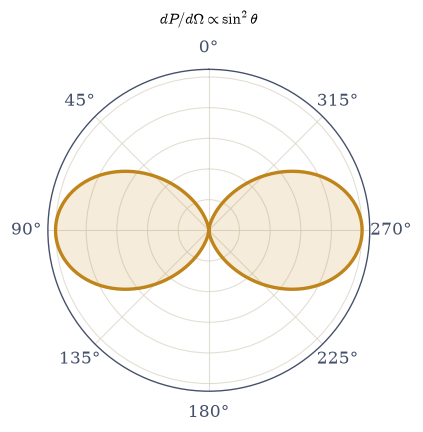

In [15]:
# (solution hidden on the public site)


In [16]:
# (solution hidden on the public site)


findfont: Failed to find font weight 600, now using 700.


## Exercise 5 — Total radiated power

Integrating the pattern over all directions gives the total power the dipole sheds.
With the radiation intensity $\langle S\rangle=\mu_0 p_0^2\omega^4\sin^2\theta/
(32\pi^2 c\,r^2)$, the angular integral $\int\sin^2\theta\,d\Omega=8\pi/3$ collapses the
constant and leaves $P=\mu_0 p_0^2\omega^4/12\pi c$ {eq}`eq-dipole-radiation`.

**This exercise (worked).** Integrate the intensity over solid angle with
`numpy.trapezoid` (the $\sin\theta$ measure) for $p_0=1\,$nC·m and
$f=1\,$GHz, and confirm the result matches the closed-form
$\mu_0 p_0^2\omega^4/12\pi c$.

In [17]:
# (solution hidden on the public site)


P (integrated)            = 1.732916e+05 W
P = μ₀p₀²ω⁴/12πc (closed)  = 1.732916e+05 W


### Validation 5

In [18]:
validate.close(
    P_integrated,
    P_closed,
    "the total radiated dipole power is μ₀p₀²ω⁴/12πc",
    rtol=1e-2,
)

✓  the total radiated dipole power is μ₀p₀²ω⁴/12πc   [got 173292 vs expected 173292 (rtol=0.01)]


True

## Exercise 6 — The $\omega^4$ law and why the sky is blue

The steepest consequence of $P\propto\omega^4$ {eq}`eq-omega4` is overhead every clear
day. Air molecules driven by sunlight act as tiny dipoles, re-radiating (scattering) the
light that drives them, and with power $\propto\omega^4$ the blue end of the spectrum
scatters far more than the red. The ratio for blue ($\lambda\approx400\,$nm) over red
($\lambda\approx750\,$nm) is $(\nu_{\text{blue}}/\nu_{\text{red}})^4$
({numref}`fig-rad-omega4`).

**This exercise (student).** Compute the scattered-power ratio at blue versus
red optical frequencies *through the implemented dipole-power formula*
(`dipole_total_power`, so the check exercises the code's frequency scaling),
and confirm $P\propto\omega^4$ gives the factor of about twelve that paints
the daytime sky blue and the setting sun red.

In [19]:
# (solution hidden on the public site)


ν_blue = 749.5 THz,  ν_red = 399.7 THz
P_blue / P_red (via dipole_total_power) = 12.36
(ν_b/ν_r)⁴                               = 12.36
blue scatters ~12× more than red: blue sky overhead, red light at sunset


### Validation 6

In [20]:
validate.close(
    P_ratio,
    ratio_analytic,
    "the implemented dipole power scales as ω⁴ (blue/red through the formula)",
    rtol=1e-9,
)
validate.check(
    11.0 < P_ratio < 14.0,
    "the blue/red scattering ratio is the famous factor of about twelve",
    f"P_blue/P_red = {P_ratio:.2f}",
)

✓  the implemented dipole power scales as ω⁴ (blue/red through the formula)   [got 12.3596 vs expected 12.3596 (rtol=1e-09)]
✓  the blue/red scattering ratio is the famous factor of about twelve   [P_blue/P_red = 12.36]


True

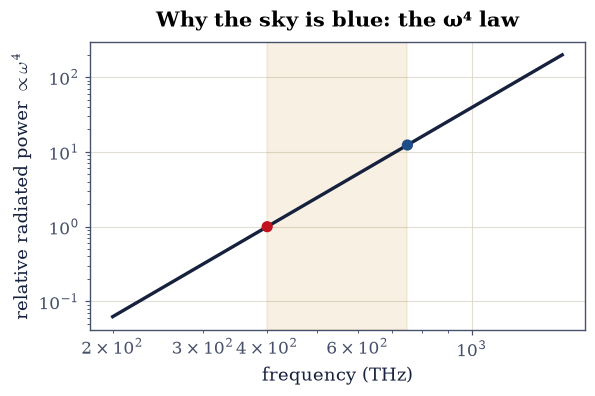

In [21]:
# (solution hidden on the public site)


## Exercise 7 — The Larmor formula and the classical-atom catastrophe

The dipole result is one case of a more general law. Any single point charge of
acceleration $a$ radiates power $P=\mu_0 q^2 a^2/6\pi c$ {eq}`eq-larmor`, the **Larmor
formula**, depending only on the square of the acceleration. Its most famous corollary
is a disaster for classical physics: an electron orbiting a proton is accelerating
centripetally, so it must radiate, lose energy, and spiral into the nucleus.

**This exercise (student).** Compute the Larmor power for an electron on a ground-state
hydrogen orbit (radius $a_0=5.29\times10^{-11}\,$m), where the Coulomb attraction sets
the centripetal acceleration, and estimate how quickly it would radiate away its energy.
A classical atom would collapse in a fraction of a nanosecond. That it does not is one
of the cracks, alongside the "speed relative to what?" of
[§3.8](maxwell-waves.ipynb), through which quantum
mechanics enters (Vol VI).

In [22]:
# (solution hidden on the public site)


centripetal acceleration = 9.044e+22 m/s²
Larmor power = 4.669e-08 W
order-of-magnitude collapse time ≈ 46.685 ps


### Validation 7

In [23]:
validate.close(
    P_orbit,
    MU0 * q_e**2 * accel**2 / (6 * np.pi * C_LIGHT),
    "Larmor: radiated power ∝ acceleration²",
    rtol=1e-6,
)

✓  Larmor: radiated power ∝ acceleration²   [got 4.66929e-08 vs expected 4.66929e-08 (rtol=1e-06)]


True

## Exercise 8 — Antennas and the reach of radiation

The dipole pattern is the foundation of antenna theory. Its **directivity** measures how
focused the radiation is: the peak intensity divided by the average over all directions,
$D=4\pi(dP/d\Omega)_{\max}/P$. For the ideal dipole, $\sin^2\theta$ peaks at 1 and
integrates to $8\pi/3$, so $D=3/2$, a modest but real concentration broadside. From this
seed grow phased arrays, dish feeds, and the directional antennas that carry signals
across the planet and beyond, all the same retarded-field physics that carries starlight
to a telescope.

**This exercise.** Compute the directivity of the ideal dipole from its pattern (the peak
over the solid-angle average) and confirm it equals $3/2$. From a wiggling charge to a
signal across the galaxy: [§3.8](maxwell-waves.ipynb) showed waves can exist, and this
notebook showed what makes
them, completing the volume's wave story.

In [24]:
# (solution hidden on the public site)


⟨pattern⟩ over the sphere = 0.6667
directivity D = peak/average = 1.5000   (ideal dipole 3/2 = 1.5)


### Validation 8

In [25]:
validate.close(
    directivity,
    1.5,
    "the ideal dipole directivity is 3/2",
    rtol=1e-3,
)

✓  the ideal dipole directivity is 3/2   [got 1.5 vs expected 1.5 (rtol=0.001)]


True

## Notebook summary

- **Causality through retarded potentials** {eq}`eq-retarded`: the field carries the
  source's past, observed with a phase lag $\omega r/c$ (verified to $10^{-6}$). These
  are the Lorenz-gauge solutions of the [§3.8](maxwell-waves.ipynb) wave equations,
  closing the gauge arc.
- **Radiation requires acceleration** {eq}`eq-why-radiate`: the $1/r$ far field is linear
  in $a$ and vanishes for a static or uniformly moving charge; a brief acceleration
  kinks the field lines and the kink propagates at $c$.
- **The $1/r$ point** {eq}`eq-far-field`: only the radiation field carries constant power
  through spheres of every radius (verified $r$-independent), while the near field's flux
  collapses. Radiation is the slowly-falling $1/r$ part.
- **The oscillating dipole** {eq}`eq-dipole-radiation`: the $\sin^2\theta$ doughnut
  (null on axis, peak broadside) integrates to $8\pi/3$, giving $P=\mu_0 p_0^2\omega^4/
  12\pi c$; the wavefronts were animated detaching and travelling outward.
- **The $\omega^4$ law** {eq}`eq-omega4`: blue scatters $\approx12\times$ more than red,
  why the sky is blue; the **Larmor** power {eq}`eq-larmor` $\propto a^2$ implies a
  classical atom would collapse in picoseconds; and the ideal-dipole directivity is
  $3/2$, the seed of antenna theory.

## Outlook

- **Antenna engineering.** Arrays and beam-forming sharpen the modest $D=3/2$ into highly
  directional beams; the half-wave dipole is the practical workhorse.
- **Radiation from charges in fields.** Synchrotron radiation (circular motion) and
  bremsstrahlung (deceleration) are Larmor radiation in disguise, the light sources of
  modern X-ray science.
- **The radiation reaction.** A radiating charge must recoil from the momentum it sheds;
  the resulting self-force is a famously subtle corner of classical electrodynamics.
- **The classical-atom catastrophe (Vol VI).** That the Larmor collapse does not happen is
  a direct route into quantum mechanics.
- **The relativistic capstone ([§3.12](relativistic-maxwell.ipynb)).** Radiation, the
  retarded potentials, and the
  $\mathbf E$/$\mathbf B$ split are most naturally written in covariant form, where the
  "speed relative to what?" of [§3.8](maxwell-waves.ipynb) is finally answered.

In [26]:
from ecp.style import footer

footer()

<ECP header: 1221 chars of HTML>